# Full Slice Registration — CONSTRAINED-SEARCH + METRICS variant
### Monje Lab — full z-slice mosaic, Hann-window rows + windowed peak search

> **This is variant B of two.** It is identical to `full_slice_registration.ipynb`, plus one
> change: instead of taking phase correlation's **global** peak, it takes the best peak **inside
> a plausible window** — a horizontal pair may barely move vertically (`|dy| ≤ MAX_CROSS_PX`),
> a vertical pair barely horizontally (`|dx| ≤ MAX_CROSS_PX`), and the join-axis shift stays
> within a band around the assumed overlap. When a spurious global peak (e.g. slid along a
> diagonal edge) sits outside the window, the **true** peak inside it wins — so each seam still
> gets its *own* measured shift rather than a borrowed one. Compare against
> `full_slice_registration_consensus.ipynb`, which snaps outliers to the neighbor median.


Give a **grid of tile paths** for one z-slice: a list of rows, each row a list of tile
paths **left → right**; rows listed **top → bottom**. The slice is stitched in two stages:

| Stage | Method |
|-------|--------|
| **1 — Horizontal (build rows)** | Every adjacent pair in a row is registered left→right with the **`basic_horizontal` engine**: cut the overlap strips, crop their **rows** to the **tissue edge** (edge-focus box), then run phase cross-correlation after a **high-pass prefilter and a Hann window**. Each row is composited into one big row image. |
| **2 — Vertical (stack rows)** | The row images are registered top→bottom with the **same engine**, just rotated: crop the overlap strips to the tissue **columns** (the vertical seam runs left↔right), then the same **high-pass + Hann-window** PCC. Composited into the full mosaic. |

Both stages use the **same edge-focus + Hann-window PCC**; the only difference is the axis —
horizontal crops the box to the tissue *rows*, vertical crops it to the tissue *columns*.

At **every step** the placement is shown two ways so the improvement is visible:
- **Naive** — assumed overlap, no shift (`dy=dx=0`).
- **Registered** — the measured `(dy, dx)`.

Overlays are red/green/yellow (A = red, B = green, overlap = yellow). Blending is a
**sinusoidal (raised-cosine) cross-fade** over each overlap. The notebook shows the raw
input tiles, the edge-focus box + Hann window at each horizontal pair, the naive-vs-registered
overlay at every step, and the final naive-vs-registered mosaic.

**Shift convention:**
- Horizontal: right tile's left edge at `x = w_left − overlap + dx`, `y = dy`.
- Vertical:   bottom row's top edge at `y = h_top − overlap + dy`, `x = dx`.


---
### Added in this variant — MSE + MI metrics (raw, for validation)

The stitching pipeline below is **identical** to `full_slice_registration_constrained.ipynb`. This variant only *adds* an evaluation layer that scores every seam **naive vs registered** with two metrics:

- **MSE** (lower = better pixel agreement)
- **Mutual information** (higher = better structural agreement)

Two choices make the score trustworthy on this data — both shared across variants:

1. **Zoomed box** — the metric is computed only inside the *same edge-focus box* used for the Hann window (the tissue band), not the whole overlap strip, so the large empty background can't dilute it.
2. **Foreground mask** — inside that box only pixels where at least one tile has tissue (`raw > THRESH`) are scored, so background-vs-background agreement isn't credited.

Metrics are computed on **raw intensities** on purpose: registration optimises the *high-passed* signal, so raw agreement is an **independent** check — improvement there is genuine corroboration that the pipeline worked, not the circular result of grading on the optimiser's own objective. Because raw MSE also carries the per-tile exposure gap, **raw MI is the more trustworthy witness** — both moving the right way (MSE down, MI up) is the validation you want.

The foreground mask also uses raw intensities (`THRESH` is a raw tissue threshold). Each seam shows its MSE box (cyan); a final section tables and plots every seam's naive→registered movement plus the whole-image aggregate.

In [1]:
# -- Imports -------------------------------------------------------
import warnings
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import tifffile
from pathlib import Path
from skimage.registration import phase_cross_correlation
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter

matplotlib.rcParams['figure.dpi'] = 120

In [2]:
# -- Core helpers (from basic_horizontal) --------------------------

def load_tile(path):
    img = tifffile.imread(str(path)).astype('float32')
    while img.ndim > 2:
        img = img[0]
    return img


def norm_disp(img, lo_pct=0.5, hi_pct=99.5):
    """Scale to [0,1] for display with robust percentile limits, so a single
    bright speck can't squash the rest of an image to near-black."""
    lo, hi = np.percentile(img, [lo_pct, hi_pct])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0.0, 1.0)


def highpass(img, sigma=12.0):
    """Subtract a large-sigma Gaussian to strip the smooth brightness envelope
    (residual vignette + tissue low-frequency gradient) so the true-texture
    correlation peak dominates. High-pass, NOT band-pass."""
    img = img.astype('float32')
    return img - gaussian_filter(img, sigma)


def hann2d(shape):
    """Separable 2D Hann window for a strip of the given shape."""
    return (np.hanning(shape[0])[:, None] * np.hanning(shape[1])[None, :]).astype('float32')


def register_pcc(strip_a, strip_b, upsample=20, highpass_sigma=12.0, window=True):
    """Phase cross-correlation of two overlap strips (high-passed). Returns
    (dy, dx): strip_b aligns to strip_a when shifted by (dy, dx).

    window=True applies a separable Hann window before the FFT (the twist that
    makes registration robust): tapering the strip to zero at its borders keeps
    hard edges / bright streaks from leaking a cross of energy through the FFT and
    stealing the peak on a spurious cross-axis shift. Both the horizontal and the
    vertical stages use window=True; window=False is kept for plain PCC if needed."""
    a, b = strip_a, strip_b
    if a.shape != b.shape:
        r = min(a.shape[0], b.shape[0]); c = min(a.shape[1], b.shape[1])
        a, b = a[:r, :c], b[:r, :c]
    if highpass_sigma:
        a, b = highpass(a, highpass_sigma), highpass(b, highpass_sigma)
    if window:
        win = hann2d(a.shape)
        a, b = a * win, b * win
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        shift, _, _ = phase_cross_correlation(a, b, upsample_factor=upsample)
    return float(shift[0]), float(shift[1])


def _pcc_prep(a, b, highpass_sigma, window):
    """Match shapes, high-pass, and Hann-window a pair of strips (shared by the
    plain and constrained PCC so both see identical input)."""
    if a.shape != b.shape:
        r = min(a.shape[0], b.shape[0]); c = min(a.shape[1], b.shape[1])
        a, b = a[:r, :c], b[:r, :c]
    if highpass_sigma:
        a, b = highpass(a, highpass_sigma), highpass(b, highpass_sigma)
    if window:
        win = hann2d(a.shape)
        a, b = a * win, b * win
    return a, b


def _parabolic_subpx(corr, py, px):
    """Sub-pixel offset of a correlation peak by a parabolic fit along each axis
    (replaces skimage's upsampled-DFT refinement for the constrained search)."""
    h, w = corr.shape
    def off(i, n, val):
        m1, p1, z = val((i - 1) % n), val((i + 1) % n), val(i)
        den = m1 - 2 * z + p1
        return 0.5 * (m1 - p1) / den if abs(den) > 1e-9 else 0.0
    dy = off(py, h, lambda k: corr[k, px])
    dx = off(px, w, lambda k: corr[py, k])
    return dy, dx


def register_pcc_constrained(strip_a, strip_b, highpass_sigma, window,
                             max_cross, join_center, join_half, axis):
    """Phase correlation that takes the best peak WITHIN A PLAUSIBLE WINDOW instead
    of the global peak. Same normalized cross-power spectrum as `register_pcc`
    (verified to reproduce skimage's shift on well-conditioned pairs), but the
    peak search is masked to physically sensible shifts:

      * axis='h': |dy| <= max_cross (a horizontal pair barely moves vertically) and
        dx in [join_center +- join_half] (near the assumed overlap).
      * axis='v': |dx| <= max_cross and dy in the join window.

    A spurious global peak (e.g. PCC sliding along a diagonal edge to dy=+65) falls
    OUTSIDE the window, so the true peak inside it wins instead. Sub-pixel via a
    parabolic fit. Returns (dy, dx) in the same convention as register_pcc."""
    a, b = _pcc_prep(strip_a, strip_b, highpass_sigma, window)
    A = np.fft.fft2(a); B = np.fft.fft2(b)
    R = A * np.conj(B); R /= np.abs(R) + 1e-12
    corr = np.fft.ifft2(R).real
    h, w = corr.shape
    dY = np.where(np.arange(h) > h // 2, np.arange(h) - h, np.arange(h))
    dX = np.where(np.arange(w) > w // 2, np.arange(w) - w, np.arange(w))
    if axis == 'h':
        oky = np.abs(dY) <= max_cross
        okx = (dX >= join_center - join_half) & (dX <= join_center + join_half)
    else:
        oky = (dY >= join_center - join_half) & (dY <= join_center + join_half)
        okx = np.abs(dX) <= max_cross
    masked = np.where(np.outer(oky, okx), corr, -np.inf)
    py, px = np.unravel_index(np.argmax(masked), masked.shape)
    dyf, dxf = _parabolic_subpx(corr, py, px)
    dy = (py - h if py > h // 2 else py) + dyf
    dx = (px - w if px > w // 2 else px) + dxf
    return float(dy), float(dx)


def edge_focus_box(strip_a, strip_b, thresh, pad_px, axis=0, min_frac=0.02, min_lines=32):
    """Indices (lo, hi) ALONG `axis` cropped to the tissue extent; the other
    dimension is left untouched. This is the "focus thin" box, generalised so the
    horizontal and vertical stages are analogous:

      * axis=0 crops ROWS  -> horizontal-seam strips (H x overlap): box hugs the
        tissue's vertical extent, full overlap width kept.
      * axis=1 crops COLS  -> vertical-seam strips (overlap x W): box hugs the
        tissue's horizontal extent, full overlap height kept.

    A line along `axis` counts as tissue when > min_frac of it is foreground
    (> thresh) in EITHER strip; keep [first..last] tissue lines padded by pad_px,
    clamped to the extent. Falls back to the full extent when there is too little
    tissue to trust (< min_lines lines)."""
    n = min(strip_a.shape[axis], strip_b.shape[axis])
    if axis == 0:
        a, b = strip_a[:n], strip_b[:n]
    else:
        a, b = strip_a[:, :n], strip_b[:, :n]
    mask = (a > thresh) | (b > thresh)
    cover = mask.mean(axis=1 - axis)            # foreground fraction per line along axis
    lines = np.where(cover > min_frac)[0]
    if lines.size == 0:
        return 0, n
    lo = max(0, int(lines[0]) - pad_px)
    hi = min(n, int(lines[-1]) + 1 + pad_px)
    if hi - lo < min_lines:
        return 0, n
    return lo, hi


def enough_signal(strip_a, strip_b, thresh, min_signal_frac):
    """Whether the two overlap strips carry enough tissue to trust PCC.

    Builds the same foreground mask edge_focus_box uses (pixels > thresh) and
    measures the fraction of EACH strip that is signal. Returns
    (ok, frac_a, frac_b): ok is False when EITHER strip has less than
    min_signal_frac of its pixels above threshold -- too little actual signal in
    the overlap to register reliably, so the caller skips PCC and falls back to
    the nominal assumed overlap (dy=dx=0)."""
    frac_a = float((strip_a > thresh).mean())
    frac_b = float((strip_b > thresh).mean())
    return (frac_a >= min_signal_frac and frac_b >= min_signal_frac), frac_a, frac_b


def sinusoid_ramp(n, feather):
    """Length-n weight: 1 in the interior, a raised-cosine ease from ~0 to 1 over
    `feather` px at each end -> a smooth sinusoidal cross-fade across overlaps."""
    w = np.ones(n, dtype='float32')
    f = int(min(feather, n // 2))
    if f > 0:
        t = (np.arange(f) + 1) / (f + 1)
        edge = (0.5 * (1 - np.cos(np.pi * t))).astype('float32')
        w[:f] = edge
        w[-f:] = edge[::-1]
    return w


def feather_weight(shape, axis, feather):
    """Sinusoidal cross-fade weight map ramping along `axis` (1 = left/right for a
    horizontal join, 0 = top/bottom for a vertical stack)."""
    ramp = sinusoid_ramp(shape[axis], feather)
    if axis == 1:
        return np.broadcast_to(ramp[None, :], shape).copy()
    return np.broadcast_to(ramp[:, None], shape).copy()


def composite(placements, feather_axis, feather_px):
    """Blend placed images onto one canvas with sinusoidal feathered weights so
    overlaps cross-fade. placements: list of (img, y0, x0) in a shared frame
    (offsets may be negative). Background pixels (value == 0) carry zero weight so
    they never bleed into a seam. Returns the canvas."""
    y_min = min(y0 for _, y0, _ in placements)
    x_min = min(x0 for _, _, x0 in placements)
    H = max(y0 - y_min + img.shape[0] for img, y0, _ in placements)
    W = max(x0 - x_min + img.shape[1] for img, _, x0 in placements)
    acc = np.zeros((H, W), 'float32'); wsum = np.zeros((H, W), 'float32')
    for img, y0, x0 in placements:
        yy, xx = y0 - y_min, x0 - x_min
        w = feather_weight(img.shape, feather_axis, feather_px)
        w[img == 0] = 0.0
        acc[yy:yy+img.shape[0], xx:xx+img.shape[1]] += w * img
        wsum[yy:yy+img.shape[0], xx:xx+img.shape[1]] += w
    return acc / np.maximum(wsum, 1e-6)

In [3]:
# -- Red/Green/Yellow overlay helpers ------------------------------
# A -> red channel, B -> green channel, so their overlap reads yellow.

def _overlay_canvas(img_a, img_b, b_y0, b_x0):
    h_a, w_a = img_a.shape; h_b, w_b = img_b.shape
    oy, ox = max(0, -b_y0), max(0, -b_x0)           # shift so nothing is clipped
    H = max(h_a, b_y0 + h_b) + oy
    W = max(w_a, b_x0 + w_b) + ox
    ch_a = np.zeros((H, W), 'float32'); ch_b = np.zeros((H, W), 'float32')
    ch_a[oy:oy+h_a, ox:ox+w_a] = norm_disp(img_a)
    ch_b[b_y0+oy:b_y0+oy+h_b, b_x0+ox:b_x0+ox+w_b] = norm_disp(img_b)
    return np.stack([ch_a, ch_b, np.zeros_like(ch_a)], -1)


def _legend(fig):
    fig.legend(handles=[mpatches.Patch(color=(1, 0, 0), label='A only'),
                        mpatches.Patch(color=(0, 1, 0), label='B only'),
                        mpatches.Patch(color=(1, 1, 0), label='Overlap (both)')],
               loc='upper right', fontsize=8, framealpha=0.6)


def compare_overlay_h(img_a, img_b, overlap, dy, dx, suptitle=''):
    """Horizontal pair (A=left, B=right): B left edge at x = w_a - overlap + dx."""
    w_a = img_a.shape[1]
    naive = _overlay_canvas(img_a, img_b, 0, w_a - overlap)
    reg   = _overlay_canvas(img_a, img_b, int(round(dy)), w_a - overlap + int(round(dx)))
    fig, axes = plt.subplots(1, 2, figsize=(16, 5))
    axes[0].imshow(naive, aspect='auto'); axes[0].set_title('NAIVE  (dy=0, dx=0)', fontsize=9); axes[0].axis('off')
    axes[1].imshow(reg,   aspect='auto'); axes[1].set_title(f'REGISTERED  (dy={dy:+.1f}, dx={dx:+.1f})', fontsize=9); axes[1].axis('off')
    _legend(fig); fig.suptitle(suptitle, fontsize=10); plt.tight_layout(); plt.show()


def compare_overlay_v(img_a, img_b, overlap, dy, dx, suptitle=''):
    """Vertical pair (A=top, B=bottom): B top edge at y = h_a - overlap + dy."""
    h_a = img_a.shape[0]
    naive = _overlay_canvas(img_a, img_b, h_a - overlap, 0)
    reg   = _overlay_canvas(img_a, img_b, h_a - overlap + int(round(dy)), int(round(dx)))
    fig, axes = plt.subplots(1, 2, figsize=(12, 8))
    axes[0].imshow(naive, aspect='auto'); axes[0].set_title('NAIVE  (dy=0, dx=0)', fontsize=9); axes[0].axis('off')
    axes[1].imshow(reg,   aspect='auto'); axes[1].set_title(f'REGISTERED  (dy={dy:+.1f}, dx={dx:+.1f})', fontsize=9); axes[1].axis('off')
    _legend(fig); fig.suptitle(suptitle, fontsize=10); plt.tight_layout(); plt.show()

In [4]:
# -- Registration + line compositing -------------------------------

def register_row(tiles, overlap_frac, thresh, pad_px, upsample, highpass_sigma,
                 max_cross, join_band_frac, min_signal_frac, label='', show=True):
    """Register a row of tiles left->right with the basic_horizontal engine, but
    with CONSTRAINED-SEARCH PCC: the peak is taken within |dy| <= max_cross and dx
    within +-join_band_frac x overlap, so a spurious diagonal-slide peak can't win.
    (`upsample` is unused here; the constrained search uses a parabolic sub-pixel
    fit.) Shows the box, the Hann window, and the overlay. Returns
    [(dy, dx, overlap), ...]."""
    shifts = []
    for i in range(1, len(tiles)):
        a, b = tiles[i-1], tiles[i]
        overlap = max(1, min(int(round(overlap_frac * a.shape[1])), a.shape[1], b.shape[1]))
        sa, sb = a[:, -overlap:], b[:, :overlap]          # A right edge, B left edge
        ok, fa, fb = enough_signal(sa, sb, thresh, min_signal_frac)
        if not ok:
            shifts.append((0.0, 0.0, overlap))
            print(f'  {label}: pair {i-1}-{i}  overlap={overlap}px  signal a={fa:.1%} '
                  f'b={fb:.1%} < {min_signal_frac:.1%}  -> too little signal, skipping '
                  f'PCC, using nominal overlap (dy=dx=0)')
            continue
        r0, r1 = edge_focus_box(sa, sb, thresh, pad_px, axis=0)
        dy, dx = register_pcc_constrained(sa[r0:r1], sb[r0:r1], highpass_sigma, True,
                                          max_cross, 0, int(round(join_band_frac * overlap)), 'h')
        shifts.append((dy, dx, overlap))
        hug = ('  [hugs top]' if r0 == 0 else '') + ('  [hugs bottom]' if r1 == sa.shape[0] else '')
        print(f'  {label}: pair {i-1}-{i}  overlap={overlap}px  box rows {r0}-{r1} '
              f'({r1-r0}px tall){hug}  dy={dy:+.2f} dx={dx:+.2f}')
        if show:
            win = hann2d(sa[r0:r1].shape)
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(norm_disp(a), cmap='gray')
            axes[0].add_patch(mpatches.Rectangle((a.shape[1]-overlap, r0), overlap, r1-r0,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[0].set_title(f'{label} tile {i-1} (A) - box on right edge', fontsize=9); axes[0].axis('off')
            axes[1].imshow(norm_disp(b), cmap='gray')
            axes[1].add_patch(mpatches.Rectangle((0, r0), overlap, r1-r0,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[1].set_title(f'{label} tile {i} (B) - box on left edge', fontsize=9); axes[1].axis('off')
            axes[2].imshow(win, cmap='viridis', aspect='auto')
            axes[2].set_title(f'Hann window ({win.shape[0]}x{win.shape[1]}) - applied before PCC', fontsize=9)
            axes[2].axis('off')
            fig.suptitle(f'{label} - horizontal pair {i-1}-{i}: edge-focus box (yellow) + Hann window',
                         fontsize=10)
            plt.tight_layout(); plt.show()
            # Sanity check: tiles vs their tissue masks (tile > thresh) that
            # edge_focus_box uses to place the box the Hann window is built on.
            mask_a, mask_b = (a > thresh), (b > thresh)
            figm, axm = plt.subplots(1, 4, figsize=(20, 5))
            axm[0].imshow(norm_disp(a), cmap='gray')
            axm[0].add_patch(mpatches.Rectangle((a.shape[1]-overlap, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[0].set_title(f'{label} tile {i-1} (A)', fontsize=9); axm[0].axis('off')
            axm[1].imshow(mask_a, cmap='gray')
            axm[1].add_patch(mpatches.Rectangle((a.shape[1]-overlap, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[1].set_title(f'(A) tissue mask (tile > {thresh:.0f})', fontsize=9); axm[1].axis('off')
            axm[2].imshow(norm_disp(b), cmap='gray')
            axm[2].add_patch(mpatches.Rectangle((0, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[2].set_title(f'{label} tile {i} (B)', fontsize=9); axm[2].axis('off')
            axm[3].imshow(mask_b, cmap='gray')
            axm[3].add_patch(mpatches.Rectangle((0, r0), overlap, r1-r0,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[3].set_title(f'(B) tissue mask (tile > {thresh:.0f})', fontsize=9); axm[3].axis('off')
            figm.suptitle(f'{label} - horizontal pair {i-1}-{i}: tiles vs tissue masks (sanity check)',
                          fontsize=10)
            plt.tight_layout(); plt.show()
            compare_overlay_h(a, b, overlap, dy, dx,
                              suptitle=f'{label} - horizontal pair (tile {i-1} = A/left, tile {i} = B/right)')
    return shifts


def register_column(rows, overlap_frac, thresh, pad_px, upsample, highpass_sigma,
                    max_cross, join_band_frac, min_signal_frac, label='', show=True):
    """Register row images top->bottom, ANALOGOUS to register_row but rotated 90deg
    (edge-focus box on COLUMNS, axis=1), with the same CONSTRAINED-SEARCH PCC: the
    peak is taken within |dx| <= max_cross and dy within +-join_band_frac x overlap.
    (`upsample` is unused; parabolic sub-pixel.) Shows the box, the Hann window, and
    the overlay. Returns [(dy, dx, overlap), ...]."""
    shifts = []
    for i in range(1, len(rows)):
        a, b = rows[i-1], rows[i]
        overlap = max(1, min(int(round(overlap_frac * a.shape[0])), a.shape[0], b.shape[0]))
        sa, sb = a[-overlap:, :], b[:overlap, :]          # A bottom edge, B top edge
        ok, fa, fb = enough_signal(sa, sb, thresh, min_signal_frac)
        if not ok:
            shifts.append((0.0, 0.0, overlap))
            print(f'  {label}: rows {i-1}-{i}  overlap={overlap}px  signal a={fa:.1%} '
                  f'b={fb:.1%} < {min_signal_frac:.1%}  -> too little signal, skipping '
                  f'PCC, using nominal overlap (dy=dx=0)')
            continue
        c0, c1 = edge_focus_box(sa, sb, thresh, pad_px, axis=1)
        dy, dx = register_pcc_constrained(sa[:, c0:c1], sb[:, c0:c1], highpass_sigma, True,
                                          max_cross, 0, int(round(join_band_frac * overlap)), 'v')
        shifts.append((dy, dx, overlap))
        w = min(sa.shape[1], sb.shape[1])
        hug = ('  [hugs left]' if c0 == 0 else '') + ('  [hugs right]' if c1 == w else '')
        print(f'  {label}: rows {i-1}-{i}  overlap={overlap}px  box cols {c0}-{c1} '
              f'({c1-c0}px wide){hug}  dy={dy:+.2f} dx={dx:+.2f}')
        if show:
            win = hann2d(sa[:, c0:c1].shape)
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(norm_disp(a), cmap='gray', aspect='auto')
            axes[0].add_patch(mpatches.Rectangle((c0, a.shape[0]-overlap), c1-c0, overlap,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[0].set_title(f'{label} row {i-1} (A) - box on bottom edge', fontsize=9); axes[0].axis('off')
            axes[1].imshow(norm_disp(b), cmap='gray', aspect='auto')
            axes[1].add_patch(mpatches.Rectangle((c0, 0), c1-c0, overlap,
                              fill=False, edgecolor='yellow', lw=1.5))
            axes[1].set_title(f'{label} row {i} (B) - box on top edge', fontsize=9); axes[1].axis('off')
            axes[2].imshow(win, cmap='viridis', aspect='auto')
            axes[2].set_title(f'Hann window ({win.shape[0]}x{win.shape[1]}) - applied before PCC', fontsize=9)
            axes[2].axis('off')
            fig.suptitle(f'{label} - vertical pair {i-1}-{i}: edge-focus box (yellow) + Hann window',
                         fontsize=10)
            plt.tight_layout(); plt.show()
            # Sanity check: row images vs their tissue masks (img > thresh) that
            # edge_focus_box uses to place the box the Hann window is built on.
            mask_a, mask_b = (a > thresh), (b > thresh)
            figm, axm = plt.subplots(1, 4, figsize=(20, 5))
            axm[0].imshow(norm_disp(a), cmap='gray', aspect='auto')
            axm[0].add_patch(mpatches.Rectangle((c0, a.shape[0]-overlap), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[0].set_title(f'{label} row {i-1} (A)', fontsize=9); axm[0].axis('off')
            axm[1].imshow(mask_a, cmap='gray', aspect='auto')
            axm[1].add_patch(mpatches.Rectangle((c0, a.shape[0]-overlap), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[1].set_title(f'(A) tissue mask (img > {thresh:.0f})', fontsize=9); axm[1].axis('off')
            axm[2].imshow(norm_disp(b), cmap='gray', aspect='auto')
            axm[2].add_patch(mpatches.Rectangle((c0, 0), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[2].set_title(f'{label} row {i} (B)', fontsize=9); axm[2].axis('off')
            axm[3].imshow(mask_b, cmap='gray', aspect='auto')
            axm[3].add_patch(mpatches.Rectangle((c0, 0), c1-c0, overlap,
                             fill=False, edgecolor='yellow', lw=1.5))
            axm[3].set_title(f'(B) tissue mask (img > {thresh:.0f})', fontsize=9); axm[3].axis('off')
            figm.suptitle(f'{label} - vertical pair {i-1}-{i}: row images vs tissue masks (sanity check)',
                          fontsize=10)
            plt.tight_layout(); plt.show()
            compare_overlay_v(a, b, overlap, dy, dx,
                              suptitle=f'{label} - vertical pair (row {i-1} = A/top, row {i} = B/bottom)')
    return shifts


def composite_line(images, shifts, axis, overlap_frac, register=True):
    """Place `images` along `axis` ('h' or 'v') and blend with a sinusoidal
    cross-fade. register=True applies the measured (dy, dx); register=False forces
    dy=dx=0 (the naive assumed-overlap baseline). Overlaps recomputed per seam so
    the naive canvas is self-consistent."""
    placements = [(images[0], 0, 0)]
    y_cur = x_cur = 0
    for k in range(1, len(images)):
        dy, dx, _ = shifts[k-1]
        prev = images[k-1]
        sdy = int(round(dy)) if register else 0
        sdx = int(round(dx)) if register else 0
        if axis == 'h':
            overlap = max(1, min(int(round(overlap_frac * prev.shape[1])),
                                 prev.shape[1], images[k].shape[1]))
            x_cur += prev.shape[1] - overlap + sdx
            y_cur += sdy
        else:
            overlap = max(1, min(int(round(overlap_frac * prev.shape[0])),
                                 prev.shape[0], images[k].shape[0]))
            y_cur += prev.shape[0] - overlap + sdy
            x_cur += sdx
        placements.append((images[k], y_cur, x_cur))
    feather_axis = 1 if axis == 'h' else 0
    fdim = images[0].shape[1] if axis == 'h' else images[0].shape[0]
    feather = max(1, int(round(overlap_frac * fdim)))
    return composite(placements, feather_axis, feather)

In [5]:
# -- Metrics: MSE + Mutual Information over a zoomed, masked overlap box --------
# Layered on top of the constrained pipeline WITHOUT changing any registration.
# For each seam we score how well the two tiles agree in their overlap, two ways:
#   * NAIVE      -- assumed overlap, dy=dx=0
#   * REGISTERED -- the measured (dy, dx)
# Shared design (see the intro): evaluate inside the SAME edge-focus box used for
# the Hann window (zoomed to the tissue band) and keep only foreground pixels
# (raw > THRESH in EITHER tile). Scoring is on RAW intensities -- an INDEPENDENT
# check, since registration optimised the high-passed signal, not raw agreement.
# The foreground mask also uses RAW intensities (THRESH is a raw tissue threshold).

# Metrics are scored on RAW intensities. Raw is the honest end-to-end validation
# signal: registration never optimised raw pixel agreement (it high-passed +
# windowed first), so raw improvement is independent corroboration that the pipeline
# worked -- not the circular "the optimiser minimised its own objective" you'd get
# from a high-passed metric. Because raw MSE also carries the per-tile exposure gap,
# raw MI is the more trustworthy witness of the two.
METRIC_VARIANTS = [
    ('raw', lambda x: x.astype('float32')),
]
VARIANT_NAMES = [name for name, _ in METRIC_VARIANTS]


def mutual_information(a_vals, b_vals, bins=64):
    """MI (nats) between two 1-D arrays of paired intensities."""
    a_vals = np.asarray(a_vals); b_vals = np.asarray(b_vals)
    if a_vals.size < 2:
        return float('nan')
    def to_bins(x):
        lo, hi = float(x.min()), float(x.max())
        if hi <= lo:
            return np.zeros(x.size, dtype=int)
        return np.clip(((x - lo) / (hi - lo) * bins).astype(int), 0, bins - 1)
    joint, _, _ = np.histogram2d(to_bins(a_vals), to_bins(b_vals),
                                 bins=bins, range=[[0, bins], [0, bins]])
    pxy = joint / (joint.sum() + 1e-12)
    px = pxy.sum(axis=1, keepdims=True); py = pxy.sum(axis=0, keepdims=True)
    nz = pxy > 0
    return float(np.sum(pxy[nz] * np.log(pxy[nz] / ((px * py)[nz] + 1e-12))))


def _overlap_box_h(a, b, overlap, r0, r1, dy, dx):
    """Aligned overlap index rectangles for a HORIZONTAL seam (A=left, B=right),
    restricted to the edge-focus box rows [r0:r1]. Returns (naiveA, naiveB, regA,
    regB), each an (row0, row1, col0, col1) tuple. Naive uses dy=dx=0."""
    h_a, w_a = a.shape; h_b, w_b = b.shape
    idy, idx = int(round(dy)), int(round(dx))
    naive_A = (r0, r1, w_a - overlap, w_a)
    naive_B = (r0, r1, 0, overlap)
    b_x0 = max(0, w_a - overlap + idx)                 # B left edge on the A frame
    col_w = min(w_a - b_x0, w_b)                        # columns where both exist
    ca0, ca1 = b_x0, b_x0 + col_w
    cb0, cb1 = 0, col_w
    ov_a0, ov_a1 = max(0, idy), min(h_a, h_b + idy)    # rows where both exist (A=B+idy)
    ra0, ra1 = max(ov_a0, r0), min(ov_a1, r1)          # ... intersected with the box
    rb0, rb1 = ra0 - idy, ra1 - idy
    return naive_A, naive_B, (ra0, ra1, ca0, ca1), (rb0, rb1, cb0, cb1)


def _overlap_box_v(a, b, overlap, c0, c1, dy, dx):
    """Aligned overlap rectangles for a VERTICAL seam (A=top, B=bottom), restricted
    to the edge-focus box columns [c0:c1]. Mirror image of _overlap_box_h."""
    h_a, w_a = a.shape; h_b, w_b = b.shape
    idy, idx = int(round(dy)), int(round(dx))
    naive_A = (h_a - overlap, h_a, c0, c1)
    naive_B = (0, overlap, c0, c1)
    b_y0 = max(0, h_a - overlap + idy)                 # B top edge on the A frame
    row_h = min(h_a - b_y0, h_b)                        # rows where both exist
    ra0, ra1 = b_y0, b_y0 + row_h
    rb0, rb1 = 0, row_h
    ov_a0, ov_a1 = max(0, idx), min(w_a, w_b + idx)    # cols where both exist (A=B+idx)
    ca0, ca1 = max(ov_a0, c0), min(ov_a1, c1)          # ... intersected with the box
    cb0, cb1 = ca0 - idx, ca1 - idx
    return naive_A, naive_B, (ra0, ra1, ca0, ca1), (rb0, rb1, cb0, cb1)


def _metric_panel(ax, a, b, b_y0, b_x0, boxA, boxB, thresh, title):
    """R/G/Y overlay (A=red, B=green) with the MSE box drawn in cyan and the
    scored background blacked out, so the panel shows exactly which pixels count.
    Geometry is identical for all four intensity variants, hence one box per seam."""
    canvas = _overlay_canvas(a, b, b_y0, b_x0)
    oy, ox = max(0, -b_y0), max(0, -b_x0)              # _overlay_canvas offset for A
    r0, r1, c0, c1 = boxA
    rb0, rb1, cb0, cb1 = boxB
    ra = a[r0:r1, c0:c1]; rb = b[rb0:rb1, cb0:cb1]
    hh = min(ra.shape[0], rb.shape[0]); ww = min(ra.shape[1], rb.shape[1])
    if hh > 0 and ww > 0:
        fg = (ra[:hh, :ww] > thresh) | (rb[:hh, :ww] > thresh)
        sub = canvas[r0 + oy:r0 + oy + hh, c0 + ox:c0 + ox + ww, :]
        sub[~fg] = 0.0                                 # black out scored background
    ax.imshow(canvas, aspect='auto')
    ax.add_patch(mpatches.Rectangle((c0 + ox, r0 + oy), c1 - c0, r1 - r0,
                 fill=False, edgecolor='cyan', lw=2))
    ax.set_title(title, fontsize=9); ax.axis('off')


def score_seam(a, b, axis, overlap, box_lo, box_hi, dy, dx, thresh, label='', show=True):
    """Score one seam naive vs registered inside the zoomed, masked overlap box,
    under all four intensity variants. Geometry + mask are computed once and shared;
    only the pixel values change per variant. Returns a dict keyed
    '<variant>|<mse|mi|pool>_<n|r>' plus foreground counts, for the aggregate."""
    if axis == 'h':
        nA, nB, rA, rB = _overlap_box_h(a, b, overlap, box_lo, box_hi, dy, dx)
        b_y0_n, b_x0_n = 0, a.shape[1] - overlap
        b_y0_r, b_x0_r = int(round(dy)), a.shape[1] - overlap + int(round(dx))
    else:
        nA, nB, rA, rB = _overlap_box_v(a, b, overlap, box_lo, box_hi, dy, dx)
        b_y0_n, b_x0_n = a.shape[0] - overlap, 0
        b_y0_r, b_x0_r = a.shape[0] - overlap + int(round(dy)), int(round(dx))

    ta = {name: fn(a) for name, fn in METRIC_VARIANTS}   # transformed tiles per variant
    tb = {name: fn(b) for name, fn in METRIC_VARIANTS}

    def crop(arr, box):
        r0, r1, c0, c1 = box
        return arr[r0:r1, c0:c1]

    res = dict(label=label, axis=axis)
    for tag, boxA, boxB in [('n', nA, nB), ('r', rA, rB)]:
        ra, rb = crop(a, boxA), crop(b, boxB)            # raw crops drive the mask
        hh = min(ra.shape[0], rb.shape[0]); ww = min(ra.shape[1], rb.shape[1])
        mask = ((ra[:hh, :ww] > thresh) | (rb[:hh, :ww] > thresh)) if (hh > 0 and ww > 0) \
            else np.zeros((0, 0), dtype=bool)
        res[f'nfg_{tag}'] = int(mask.sum())
        for name, _ in METRIC_VARIANTS:
            if mask.size and mask.sum() >= 2:
                pa = crop(ta[name], boxA)[:hh, :ww][mask].astype('float64')
                pb = crop(tb[name], boxB)[:hh, :ww][mask].astype('float64')
                mse = float(np.mean((pa - pb) ** 2)); mi = mutual_information(pa, pb)
            else:
                pa = pb = np.array([]); mse = mi = float('nan')
            res[f'{name}|mse_{tag}'] = mse
            res[f'{name}|mi_{tag}'] = mi
            res[f'{name}|pool_{tag}'] = (pa, pb)

    # per-seam printout (one line per variant)
    print(f'  [metrics] {label}   fg naive/reg = {res["nfg_n"]:,}/{res["nfg_r"]:,}')
    for name, _ in METRIC_VARIANTS:
        mn, mr = res[f'{name}|mse_n'], res[f'{name}|mse_r']
        in_, ir = res[f'{name}|mi_n'], res[f'{name}|mi_r']
        d_mse = 100.0 * (mr - mn) / mn if mn else float('nan')
        d_mi = 100.0 * (ir - in_) / in_ if in_ else float('nan')
        print(f'      {name:<6} MSE {mn:10.4f} -> {mr:10.4f} ({d_mse:+6.1f}%)   '
              f'MI {in_:6.4f} -> {ir:6.4f} ({d_mi:+6.1f}%)')

    if show:
        fig, axes = plt.subplots(1, 2, figsize=(16, 5) if axis == 'h' else (12, 8))
        _metric_panel(axes[0], a, b, b_y0_n, b_x0_n, nA, nB, thresh,
                      f'NAIVE  (fg={res["nfg_n"]:,})')
        _metric_panel(axes[1], a, b, b_y0_r, b_x0_r, rA, rB, thresh,
                      f'REGISTERED  (fg={res["nfg_r"]:,})')
        _legend(fig)
        fig.suptitle(f'{label} - MSE/MI box (cyan): zoomed to tissue, background masked '
                     f'(same region for all 4 intensity variants)', fontsize=10)
        plt.tight_layout(); plt.show()

    return res


In [6]:
# -- User inputs ---------------------------------------------------
# GRID is a list of ROWS, each row a list of tile paths LEFT -> RIGHT; rows are
# listed TOP -> BOTTOM. Any grid size works; rows need not be the same length.

# ## Test Case 1: New Dataset (Sample 1)
# BASE  = "/Users/spaltahill/Test Images Jul 13"
# _stem = "260713_UltraII_5300149-5R_AFp80_cfos647p80_thickness3d5_width80_step40_ol20"

# # 48 or 82
# Z_SLICE = 82   # z-plane to stitch (the z#### in the filename); change freely


# # Test Case 2: New Dataset (Sample 2)
# BASE  = "/Users/spaltahill/Test Images Jul 13"
# _stem = "260713_UltraII_5300149-1R_AFp80_HNA568p65_cfos647p80_thickness3d5_width80_step40_ol20"

# # 50 or 100
# Z_SLICE = 100   # z-plane to stitch (the z#### in the filename); change freely

# Test Case 3: OG Test Images
BASE  = "/Users/spaltahill/test_images"
_stem = "260128_UltraII_5300148-2R_AF_HNACy3_cfos_2x_thickness3d5_width60_20ol_10umstep"

# 100 or 190
Z_SLICE = 100   # z-plane to stitch (the z#### in the filename); change freely


def _p(r, c, z=None):
    z = Z_SLICE if z is None else z
    return f"{BASE}/{_stem}[{r:02d} x {c:02d}]_C00_z{z:04d}.ome.tif"

GRID = [
    [_p(0, 0), _p(0, 1), _p(0, 2)],   # top row
    [_p(1, 0), _p(1, 1), _p(1, 2)],
    [_p(2, 0), _p(2, 1), _p(2, 2)],   # bottom row
]

OVERLAP_FRAC_H = 0.20     # assumed horizontal overlap (fraction of tile WIDTH)
OVERLAP_FRAC_V = 0.20     # assumed vertical   overlap (fraction of row  HEIGHT)
OTSU_MULTIPLIER = 0.5     # tissue mask threshold = OTSU_MULTIPLIER x Otsu(all tiles)
EDGE_PAD_PX     = 80      # rows kept either side of the tissue edge (horizontal box)
UPSAMPLE        = 20      # (unused in this variant; constrained search uses parabolic sub-pixel)
HIGHPASS_SIGMA  = 12      # Gaussian sigma for the high-pass prefilter
MIN_SIGNAL_FRAC = 0.05    # min fraction of EACH overlap strip that must be signal
                          # (foreground > tissue thresh) to register with PCC; below
                          # this, skip PCC and default to the nominal overlap (dy=dx=0)

# -- Constrained peak search ---------------------------------------
# Take the best correlation peak INSIDE a plausible window, not the global peak.
# MAX_CROSS_PX bounds the cross-axis shift (|dy| for a horizontal seam, |dx| for a
# vertical one) -- tiles in a row/column barely move on the cross axis. The join-
# axis shift is bounded to +-JOIN_BAND_FRAC x overlap around the assumed overlap.
MAX_CROSS_PX   = 20    # max plausible cross-axis shift (px)
JOIN_BAND_FRAC = 1.0   # join-axis search half-width, as a fraction of the overlap

n_rows = len(GRID)
assert n_rows >= 1 and all(len(r) >= 1 for r in GRID), 'each row needs >= 1 tile'
print(f'Grid: {n_rows} rows  ->  row sizes {[len(r) for r in GRID]}  |  z-slice {Z_SLICE}')

Grid: 3 rows  ->  row sizes [3, 3, 3]  |  z-slice 100


Tissue threshold (Otsu x 0.5) = 1266.6
  row 0 col 0: shape=(2560, 2160) dtype=float32 max=1481.0
  row 0 col 1: shape=(2560, 2160) dtype=float32 max=5212.0
  row 0 col 2: shape=(2560, 2160) dtype=float32 max=3243.0
  row 1 col 0: shape=(2560, 2160) dtype=float32 max=6269.0
  row 1 col 1: shape=(2560, 2160) dtype=float32 max=8164.0
  row 1 col 2: shape=(2560, 2160) dtype=float32 max=4901.0
  row 2 col 0: shape=(2560, 2160) dtype=float32 max=6607.0
  row 2 col 1: shape=(2560, 2160) dtype=float32 max=7081.0
  row 2 col 2: shape=(2560, 2160) dtype=float32 max=3665.0


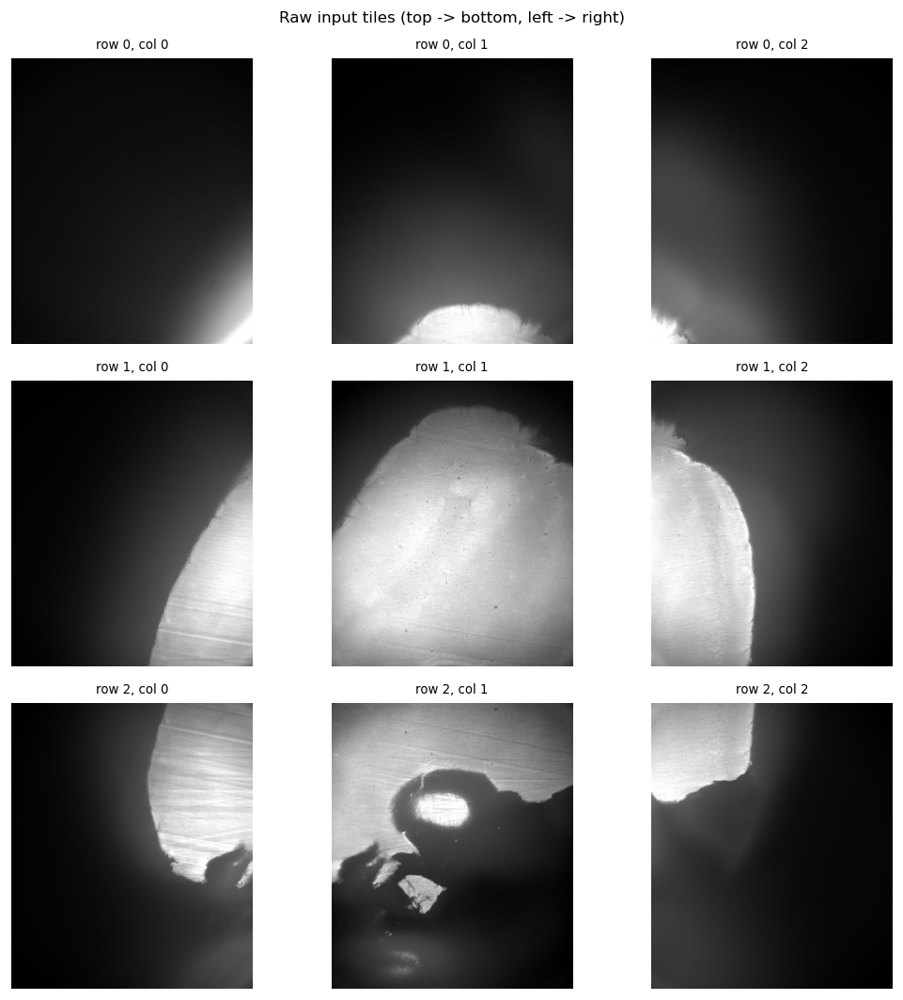

In [7]:
# -- Load and display the raw tiles + tissue threshold -------------
grid_tiles = [[load_tile(p) for p in row] for row in GRID]

# Tissue mask threshold from an Otsu split over a subsample of every tile.
_sample = np.concatenate([t[::8, ::8].ravel() for row in grid_tiles for t in row])
THRESH  = OTSU_MULTIPLIER * threshold_otsu(_sample)
print(f'Tissue threshold (Otsu x {OTSU_MULTIPLIER}) = {THRESH:.1f}')
for r, row in enumerate(grid_tiles):
    for c, t in enumerate(row):
        print(f'  row {r} col {c}: shape={t.shape} dtype={t.dtype} max={t.max():.1f}')

# Preview the raw input grid.
ncol = max(len(row) for row in grid_tiles)
fig, axes = plt.subplots(n_rows, ncol, figsize=(3 * ncol, 3 * n_rows), squeeze=False)
for r, row in enumerate(grid_tiles):
    for c in range(ncol):
        ax = axes[r][c]; ax.axis('off')
        if c < len(row):
            ax.imshow(norm_disp(row[c]), cmap='gray')
            ax.set_title(f'row {r}, col {c}', fontsize=8)
plt.suptitle('Raw input tiles (top -> bottom, left -> right)', fontsize=10)
plt.tight_layout(); plt.show()

---
## Stage 1 — Horizontal registration (each grid row → one row image)

Every adjacent pair in a row is registered left→right with the **`basic_horizontal`
engine**: the overlap strips are cropped to the tissue edge (yellow box), high-passed, and
**Hann-windowed** before the **constrained-search** PCC (peak taken within `|dy| ≤ MAX_CROSS_PX`
and `dx` near the assumed overlap). For each pair you see the box on both tiles, the Hann window
that was applied, and the naive-vs-registered R/G/Y overlay. Each row is then composited
**twice** — registered and naive — so the comparison carries through to the mosaic.


  ROW 0  (3 tiles)
  row 0: pair 0-1  overlap=432px  signal a=0.6% b=3.9% < 5.0%  -> too little signal, skipping PCC, using nominal overlap (dy=dx=0)
  row 0: pair 1-2  overlap=432px  box rows 1730-2560 (830px tall)  [hugs bottom]  dy=+16.02 dx=+22.00


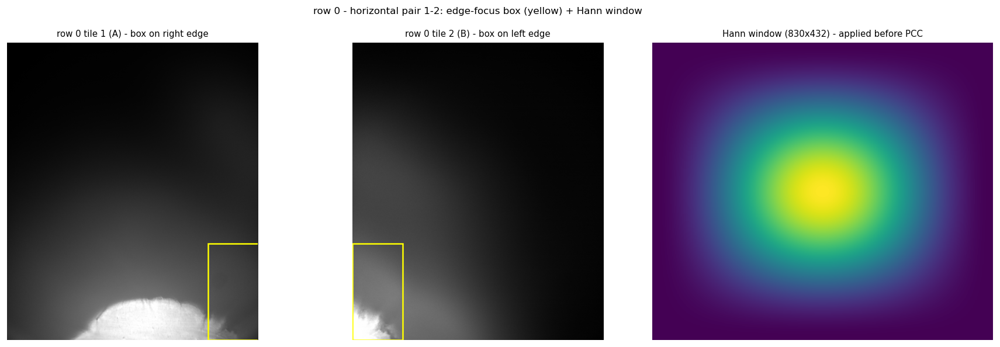

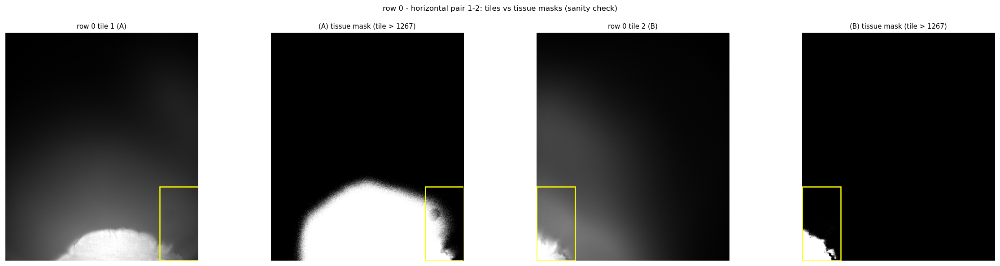

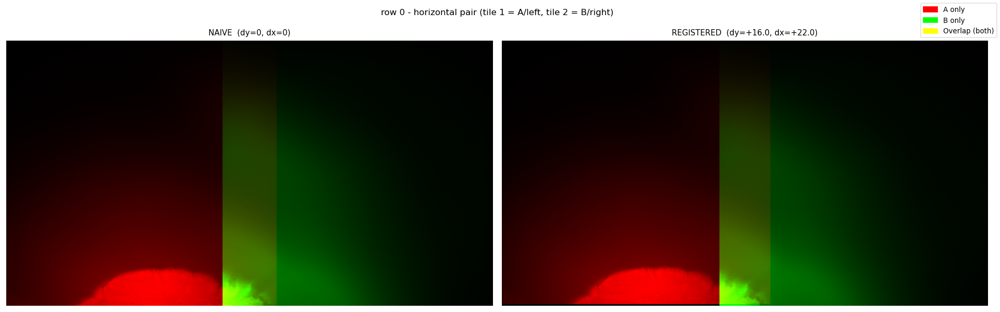

  row 0: registered shape=(2576, 5638)   naive shape=(2560, 5616)

  ROW 1  (3 tiles)
  row 1: pair 0-1  overlap=432px  box rows 63-2560 (2497px tall)  [hugs bottom]  dy=+2.25 dx=-63.45


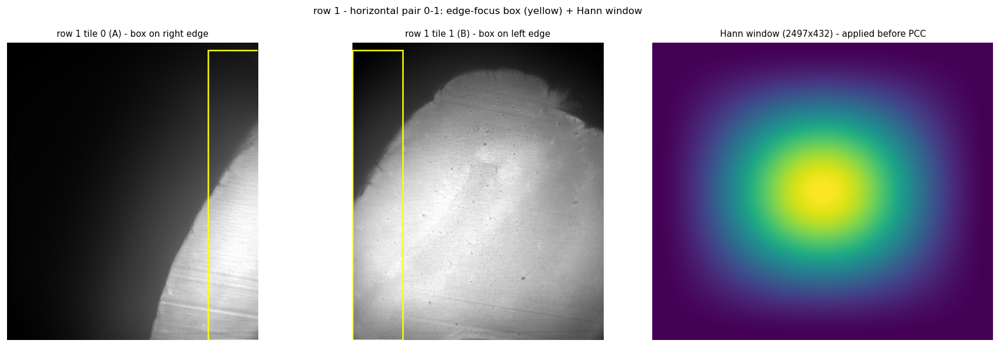

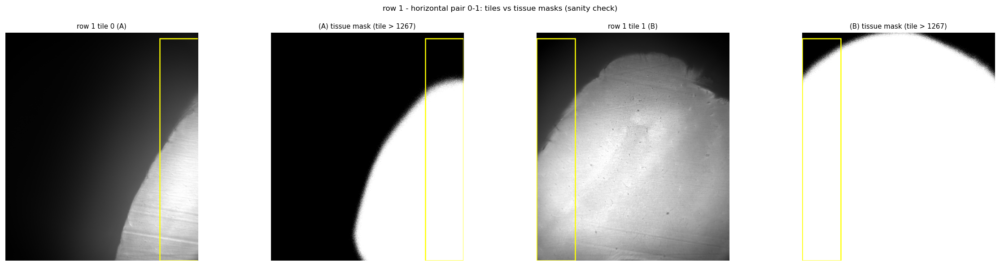

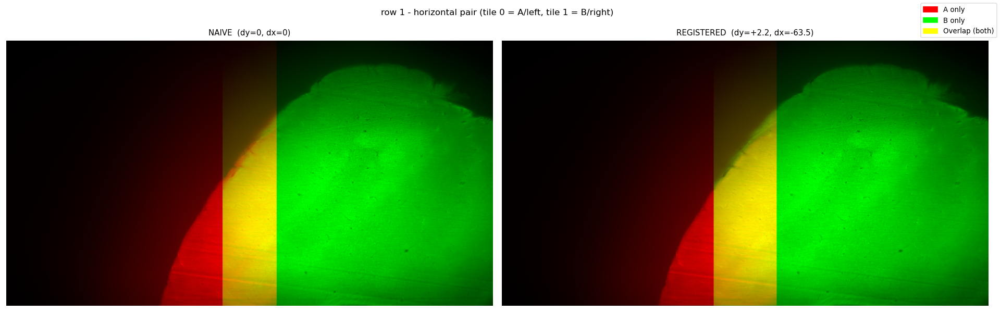

  row 1: pair 1-2  overlap=432px  box rows 87-2560 (2473px tall)  [hugs bottom]  dy=-5.96 dx=-66.25


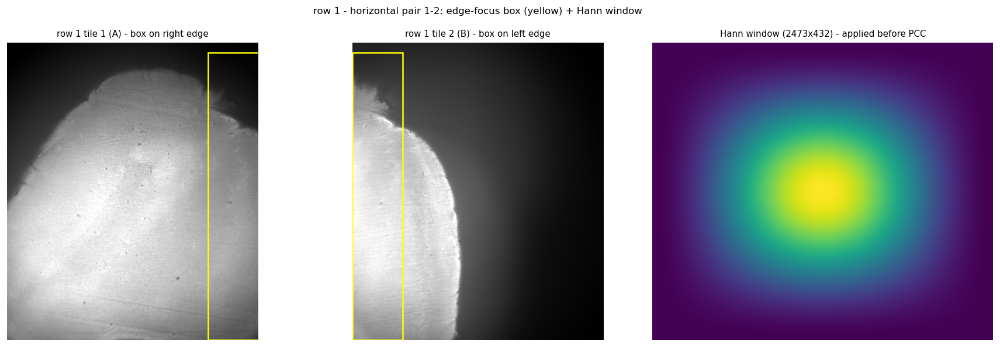

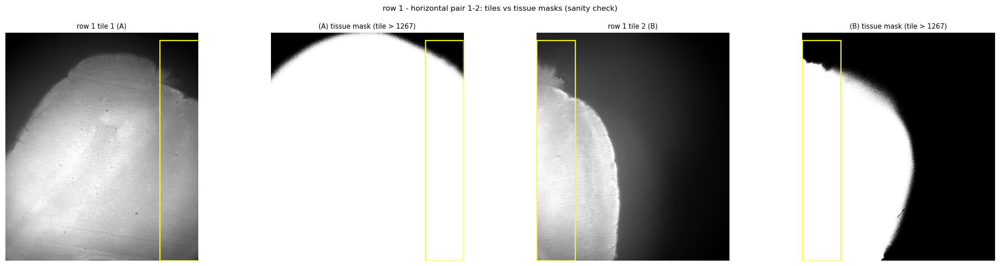

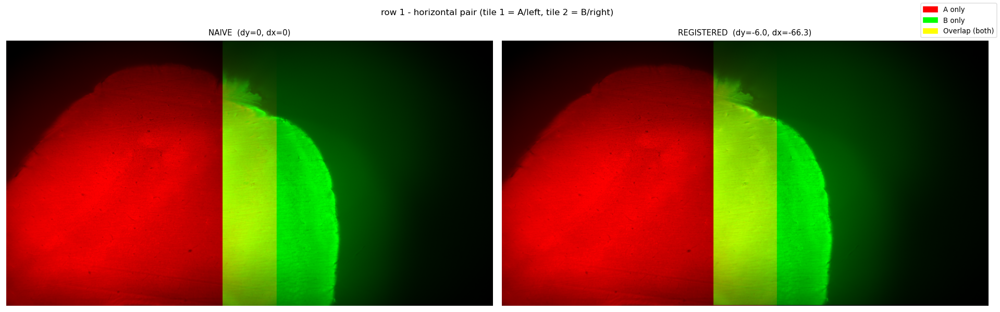

  row 1: registered shape=(2566, 5487)   naive shape=(2560, 5616)

  ROW 2  (3 tiles)
  row 2: pair 0-1  overlap=432px  box rows 0-2560 (2560px tall)  [hugs top]  [hugs bottom]  dy=-3.88 dx=-67.90


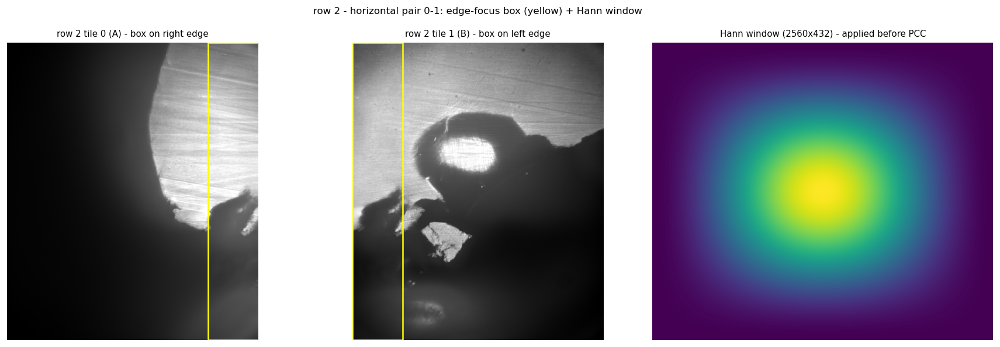

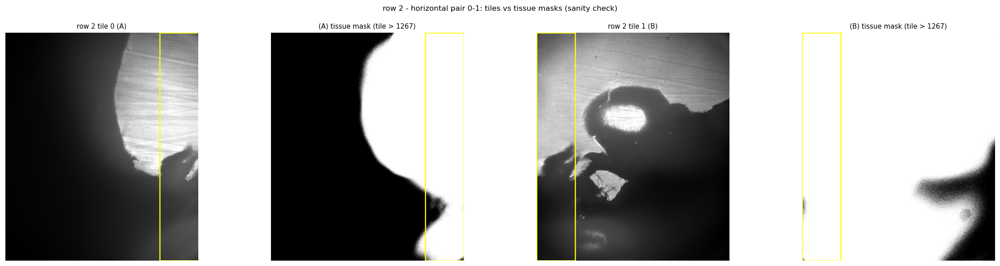

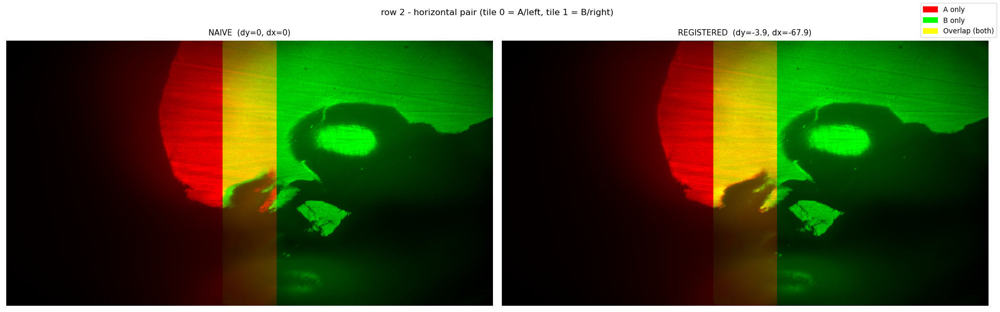

  row 2: pair 1-2  overlap=432px  box rows 0-2560 (2560px tall)  [hugs top]  [hugs bottom]  dy=-2.85 dx=-69.00


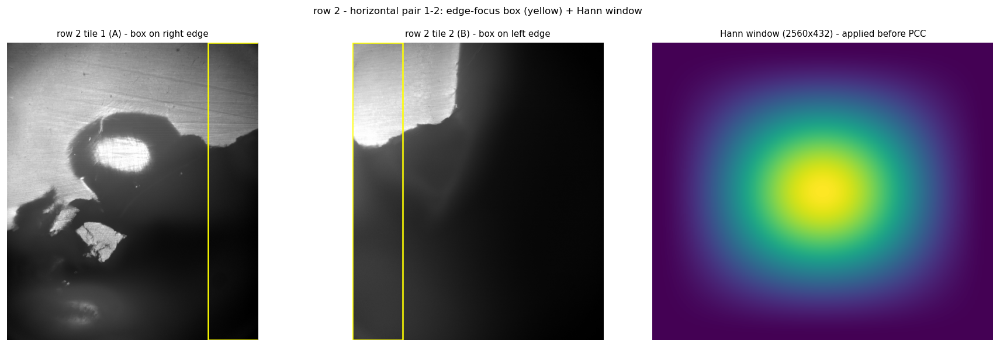

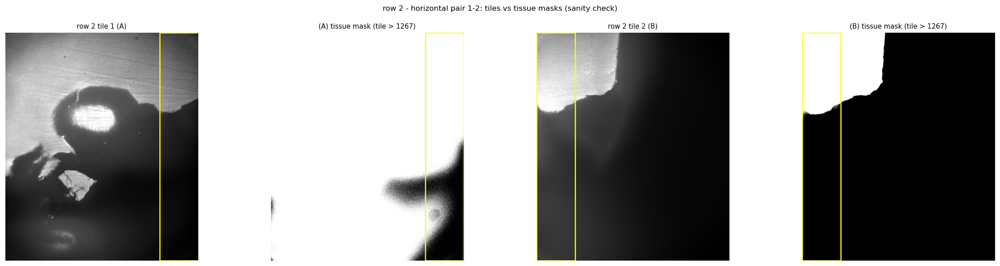

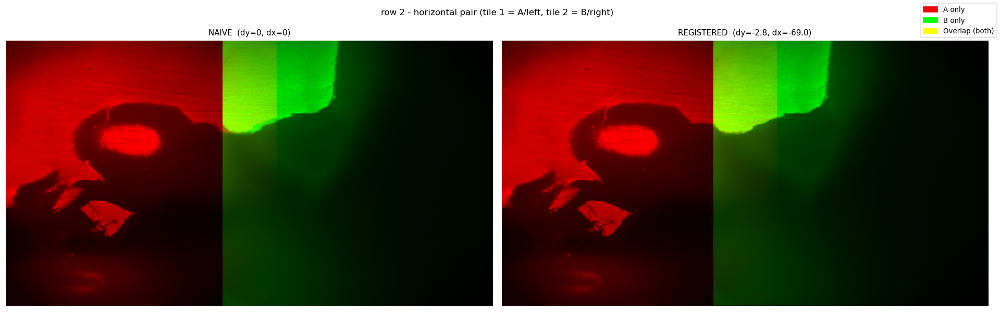

  row 2: registered shape=(2567, 5479)   naive shape=(2560, 5616)


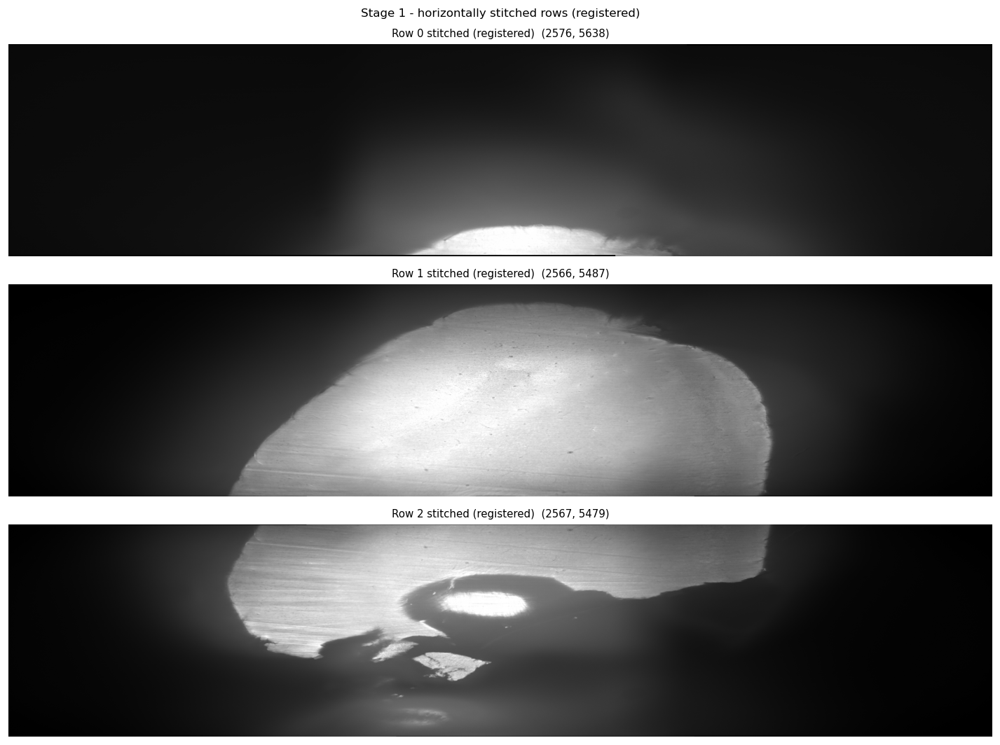

In [8]:
# -- Stage 1: build each row image (registered + naive) ------------
row_shifts = []   # per row: [(dy, dx, overlap), ...]
rows_reg   = []   # registered row images
rows_naive = []   # naive row images (fixed overlap, dy=dx=0)

for r, tiles in enumerate(grid_tiles):
    print(f"\n{'='*70}\n  ROW {r}  ({len(tiles)} tiles)\n{'='*70}")
    if len(tiles) == 1:
        shifts = []
        print('  single tile - nothing to register')
    else:
        shifts = register_row(tiles, OVERLAP_FRAC_H, THRESH, EDGE_PAD_PX,
                              UPSAMPLE, HIGHPASS_SIGMA, MAX_CROSS_PX, JOIN_BAND_FRAC,
                              MIN_SIGNAL_FRAC, label=f'row {r}', show=True)
    reg   = composite_line(tiles, shifts, 'h', OVERLAP_FRAC_H, register=True)
    naive = composite_line(tiles, shifts, 'h', OVERLAP_FRAC_H, register=False)
    row_shifts.append(shifts)
    rows_reg.append(reg)
    rows_naive.append(naive)
    print(f'  row {r}: registered shape={reg.shape}   naive shape={naive.shape}')

# Show the registered row images stacked for a quick look.
fig, axes = plt.subplots(n_rows, 1, figsize=(12, 3 * n_rows), squeeze=False)
for r, img in enumerate(rows_reg):
    axes[r][0].imshow(norm_disp(img), cmap='gray', aspect='auto')
    axes[r][0].set_title(f'Row {r} stitched (registered)  {img.shape}', fontsize=9)
    axes[r][0].axis('off')
plt.suptitle('Stage 1 - horizontally stitched rows (registered)', fontsize=10)
plt.tight_layout(); plt.show()

---
## Stage 1 metrics — horizontal seam agreement (naive vs registered)

Each horizontal seam is re-scored inside the **same edge-focus box** used for its Hann window, with the background masked out. Cyan box = exactly the pixels that count toward MSE/MI, computed on **raw** intensities.


----------------------------------------------------------------------
  ROW 0 horizontal seam metrics
----------------------------------------------------------------------
  [metrics] R0 H0-1   fg naive/reg = 43,928/43,928
      raw    MSE 122867.9329 -> 122867.9329 (  +0.0%)   MI 0.1351 -> 0.1351 (  +0.0%)


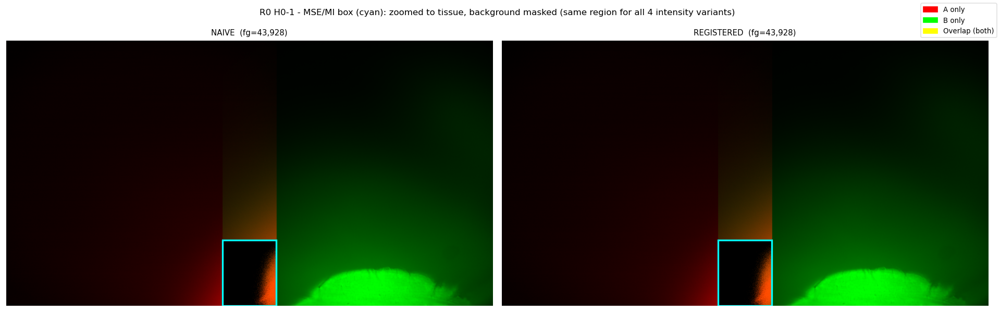

  [metrics] R0 H1-2   fg naive/reg = 149,305/137,017
      raw    MSE 118887.4144 -> 136299.0417 ( +14.6%)   MI 0.6630 -> 0.6330 (  -4.5%)


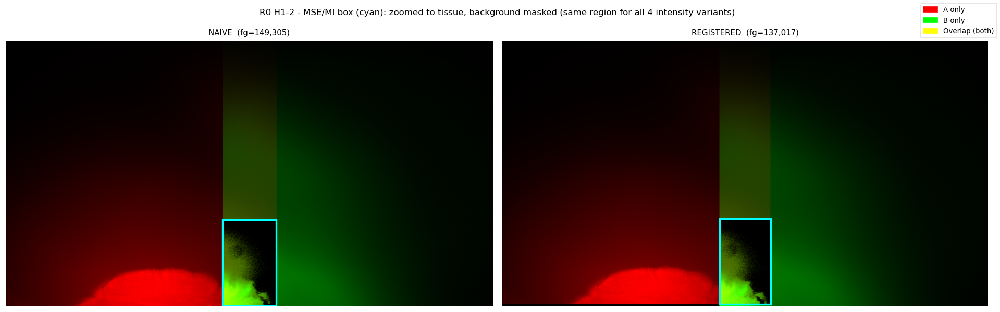


----------------------------------------------------------------------
  ROW 1 horizontal seam metrics
----------------------------------------------------------------------
  [metrics] R1 H0-1   fg naive/reg = 970,249/1,121,553
      raw    MSE 586088.1603 -> 826170.4028 ( +41.0%)   MI 1.3852 -> 1.4470 (  +4.5%)


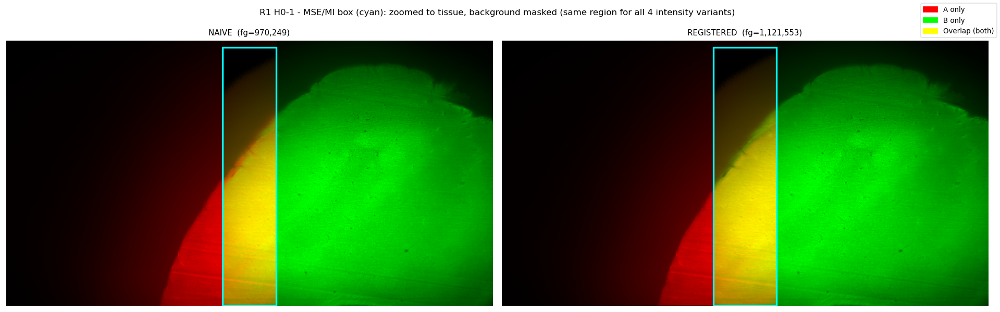

  [metrics] R1 H1-2   fg naive/reg = 970,829/1,124,386
      raw    MSE 597094.9362 -> 674094.4621 ( +12.9%)   MI 0.9273 -> 1.0285 ( +10.9%)


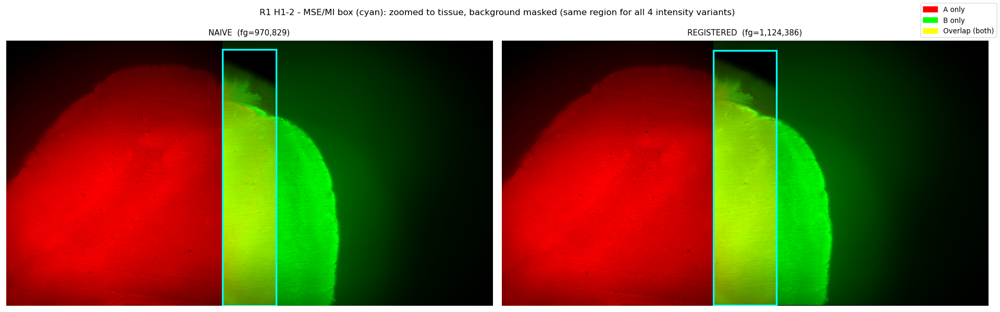


----------------------------------------------------------------------
  ROW 2 horizontal seam metrics
----------------------------------------------------------------------
  [metrics] R2 H0-1   fg naive/reg = 1,102,505/1,274,397
      raw    MSE 455599.3115 -> 345865.9699 ( -24.1%)   MI 1.0959 -> 1.2329 ( +12.5%)


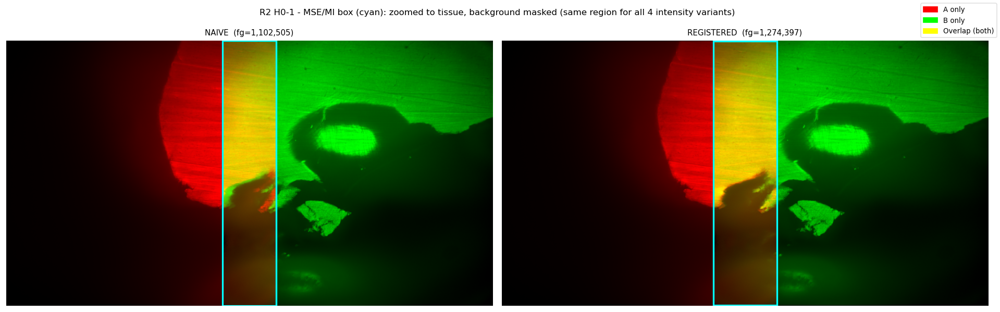

  [metrics] R2 H1-2   fg naive/reg = 739,378/891,193
      raw    MSE 411691.9760 -> 467962.3315 ( +13.7%)   MI 1.1394 -> 1.1897 (  +4.4%)


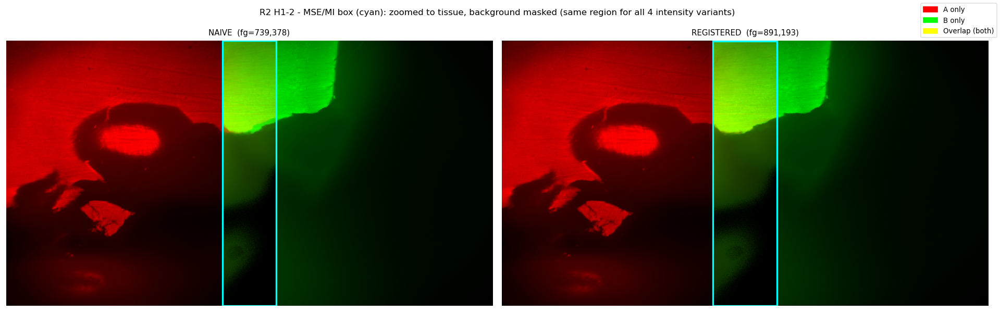

In [9]:
# -- Stage 1 metrics: score every horizontal seam (naive vs registered) --------
seam_metrics = []   # global list; Stage 2 appends to it too

for r, tiles in enumerate(grid_tiles):
    if len(tiles) < 2:
        continue
    print(f"\n{'-'*70}\n  ROW {r} horizontal seam metrics\n{'-'*70}")
    for i in range(1, len(tiles)):
        a, b = tiles[i-1], tiles[i]
        dy, dx, overlap = row_shifts[r][i-1]
        sa, sb = a[:, -overlap:], b[:, :overlap]           # same strips as register_row
        r0, r1 = edge_focus_box(sa, sb, THRESH, EDGE_PAD_PX, axis=0)
        m = score_seam(a, b, 'h', overlap, r0, r1, dy, dx, THRESH,
                       label=f'R{r} H{i-1}-{i}', show=True)
        seam_metrics.append(m)


---
## Stage 2 — Vertical registration (row images → full mosaic)

The registered row images are registered top→bottom with the **same edge-focus + Hann-window
PCC** as Stage 1, just rotated: the overlap strips are cropped to the tissue **columns** (the
vertical seam runs left↔right), then high-passed and Hann-windowed before the **constrained-search**
PCC (`|dx| ≤ MAX_CROSS_PX`, `dy` near the assumed overlap). Each pair shows the box, the Hann
window, and the naive-vs-registered overlay. The naive mosaic is built in parallel from the
**naive** rows placed at the assumed overlap with no shift.

Registering rows top -> bottom (edge-focus box on columns + constrained PCC):
  rows: rows 0-1  overlap=515px  box cols 1753-4068 (2315px wide)  dy=-84.78 dx=+3.31


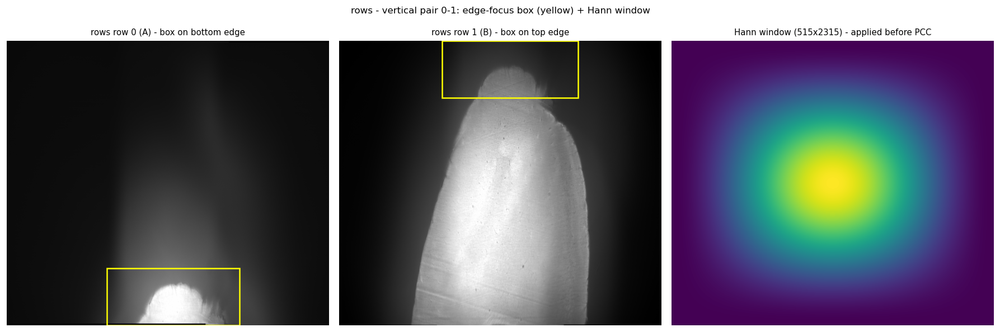

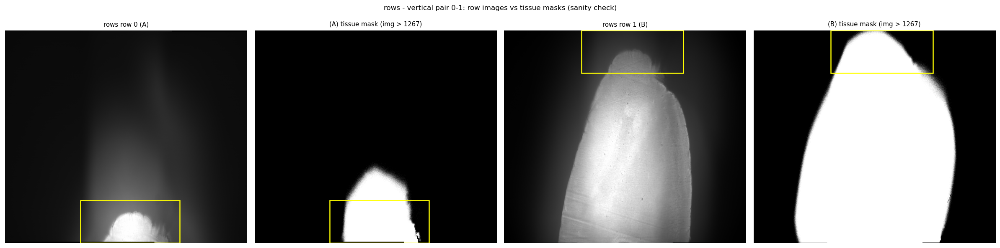

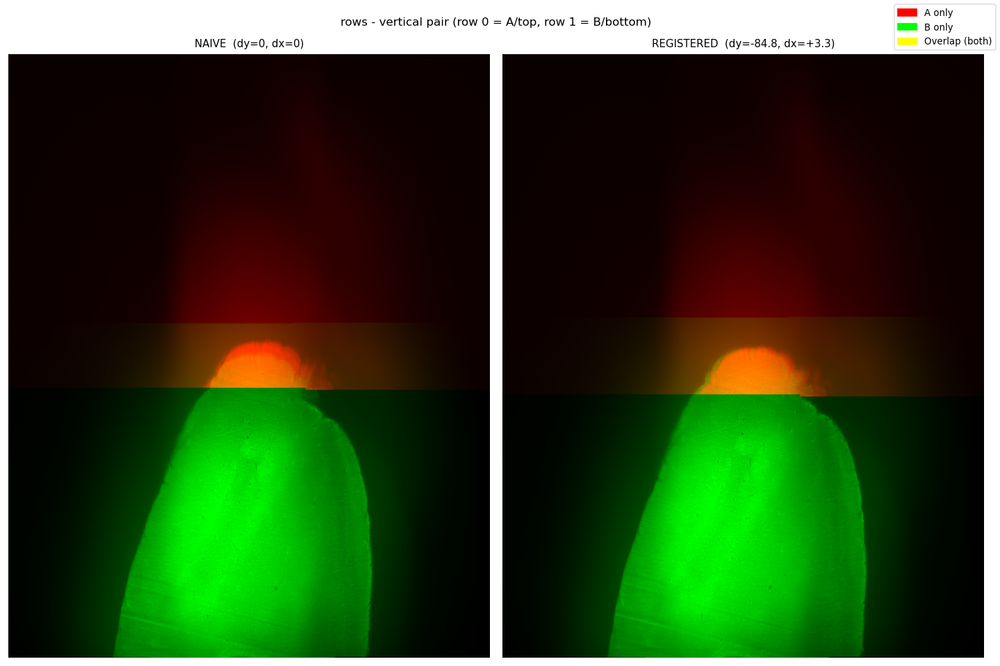

  rows: rows 1-2  overlap=513px  box cols 826-4542 (3716px wide)  dy=-82.67 dx=+5.27


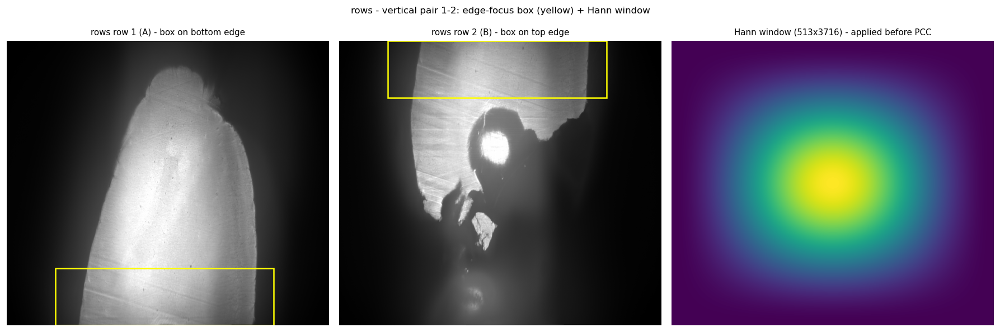

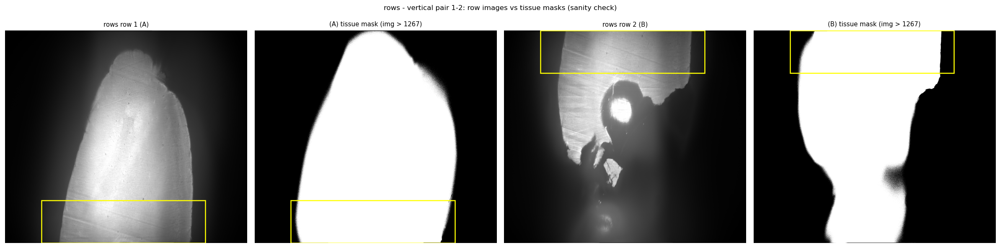

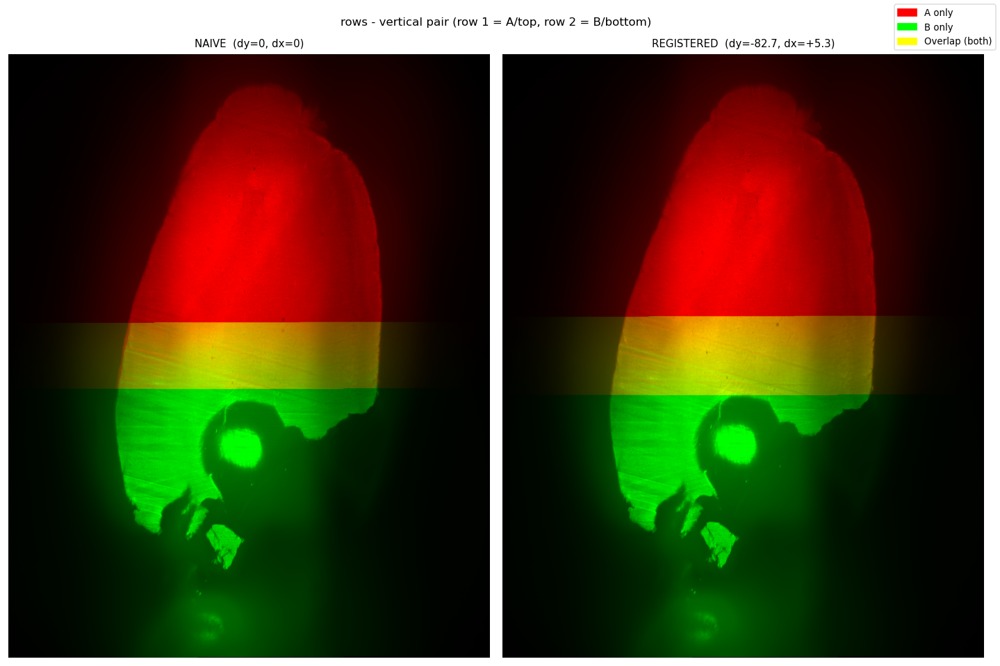


Registered mosaic shape = (6513, 5638)
Naive mosaic shape      = (6656, 5616)


In [10]:
# -- Stage 2: stitch the row images vertically ---------------------
if n_rows == 1:
    print('Only one row - the row image IS the full mosaic.')
    v_shifts     = []
    mosaic_reg   = rows_reg[0]
    mosaic_naive = rows_naive[0]
else:
    print('Registering rows top -> bottom (edge-focus box on columns + constrained PCC):')
    v_shifts = register_column(rows_reg, OVERLAP_FRAC_V, THRESH, EDGE_PAD_PX,
                               UPSAMPLE, HIGHPASS_SIGMA, MAX_CROSS_PX, JOIN_BAND_FRAC,
                               MIN_SIGNAL_FRAC, label='rows', show=True)
    mosaic_reg   = composite_line(rows_reg,   v_shifts, 'v', OVERLAP_FRAC_V, register=True)
    mosaic_naive = composite_line(rows_naive, v_shifts, 'v', OVERLAP_FRAC_V, register=False)

print(f'\nRegistered mosaic shape = {mosaic_reg.shape}')
print(f'Naive mosaic shape      = {mosaic_naive.shape}')

---
## Stage 2 metrics — vertical seam agreement (naive vs registered)

Same scoring rotated 90°: the box hugs the tissue **columns** of the vertical seam.


----------------------------------------------------------------------
  Vertical seam metrics (row images)
----------------------------------------------------------------------
  [metrics] V 0-1   fg naive/reg = 866,170/1,022,690
      raw    MSE 901238.4376 -> 526894.9804 ( -41.5%)   MI 0.6694 -> 0.8173 ( +22.1%)


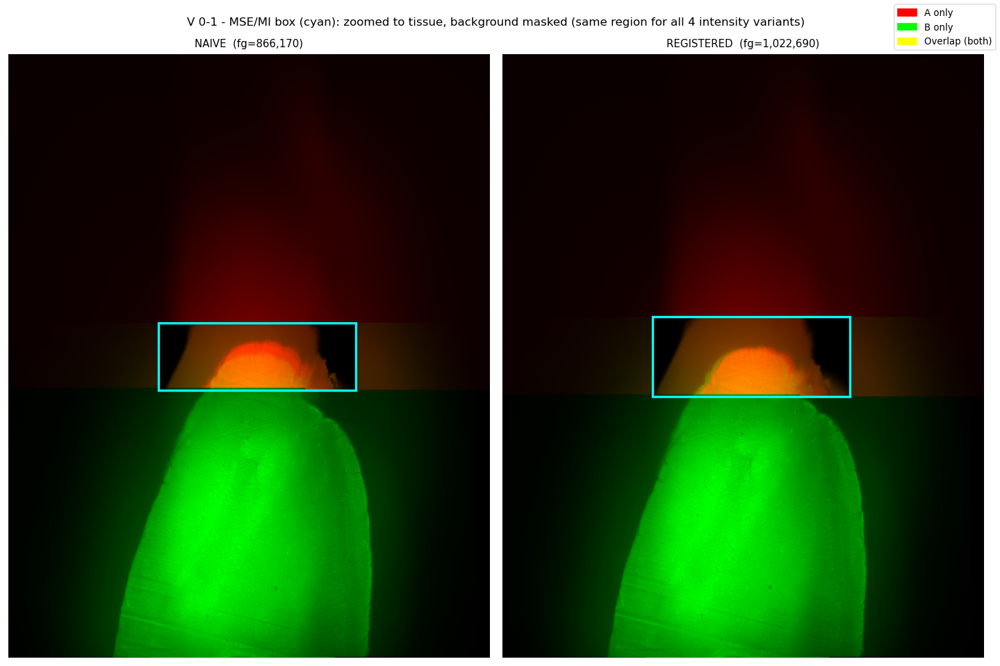

  [metrics] V 1-2   fg naive/reg = 1,731,594/2,019,673
      raw    MSE 2047690.4480 -> 2136394.4448 (  +4.3%)   MI 0.7634 -> 0.7369 (  -3.5%)


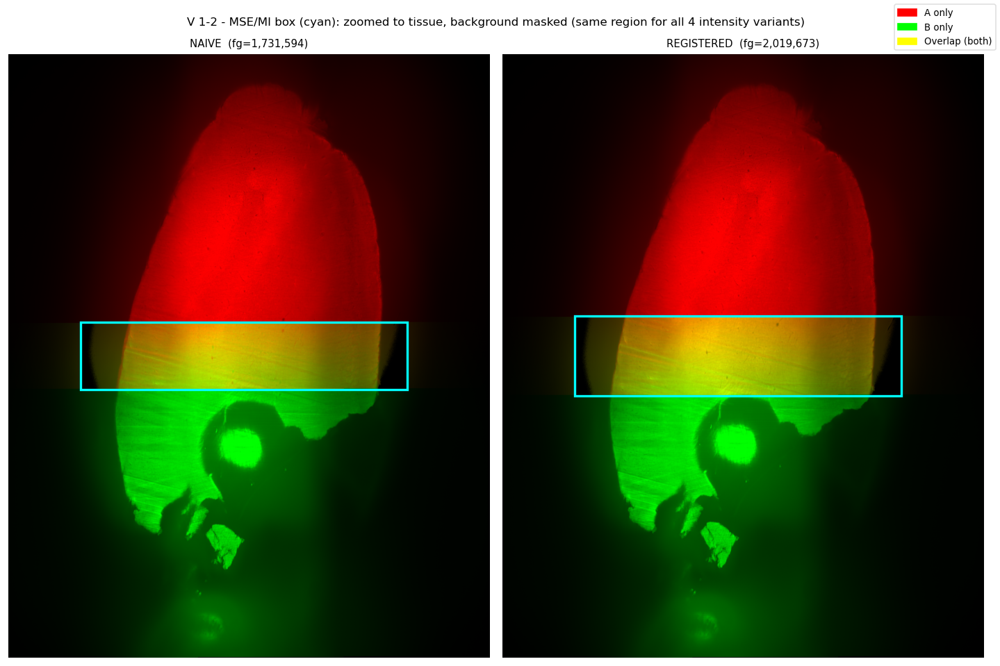

In [11]:
# -- Stage 2 metrics: score every vertical seam (naive vs registered) ----------
if n_rows >= 2:
    print(f"\n{'-'*70}\n  Vertical seam metrics (row images)\n{'-'*70}")
    for i in range(1, n_rows):
        a, b = rows_reg[i-1], rows_reg[i]
        dy, dx, overlap = v_shifts[i-1]
        sa, sb = a[-overlap:, :], b[:overlap, :]           # same strips as register_column
        c0, c1 = edge_focus_box(sa, sb, THRESH, EDGE_PAD_PX, axis=1)
        m = score_seam(a, b, 'v', overlap, c0, c1, dy, dx, THRESH,
                       label=f'V {i-1}-{i}', show=True)
        seam_metrics.append(m)
else:
    print('Single row - no vertical seams to score.')


---
## Final output — naive vs registered full mosaic

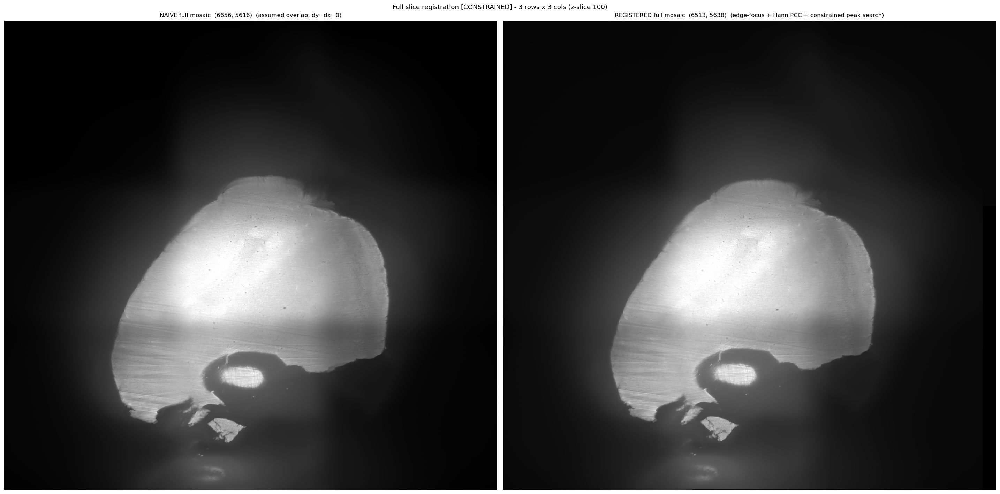

Registered mosaic saved to: /Users/spaltahill/test_images/260128_UltraII_5300148-2R_AF_HNACy3_cfos_2x_thickness3d5_width60_20ol_10umstep_z0100_slice_registered_constrained.tif


In [12]:
# -- Final: naive vs registered full mosaic ------------------------
fig, axes = plt.subplots(1, 2, figsize=(
    min(24, max(mosaic_reg.shape[1], mosaic_naive.shape[1]) // 80 + 2), 12))
axes[0].imshow(norm_disp(mosaic_naive), cmap='gray', aspect='auto')
axes[0].set_title(f'NAIVE full mosaic  {mosaic_naive.shape}  (assumed overlap, dy=dx=0)', fontsize=10)
axes[0].axis('off')
axes[1].imshow(norm_disp(mosaic_reg), cmap='gray', aspect='auto')
axes[1].set_title(f'REGISTERED full mosaic  {mosaic_reg.shape}  '
                  f'(edge-focus + Hann PCC + constrained peak search)', fontsize=10)
axes[1].axis('off')
plt.suptitle(f'Full slice registration [CONSTRAINED] - {n_rows} rows x '
             f'{max(len(r) for r in GRID)} cols (z-slice {Z_SLICE})', fontsize=11)
plt.tight_layout(); plt.show()

# Save the registered mosaic (normalised for visualisation).
out_path = Path(BASE) / f"{_stem}_z{Z_SLICE:04d}_slice_registered_constrained.tif"
tifffile.imwrite(str(out_path), norm_disp(mosaic_reg).astype('float32'))
print(f'Registered mosaic saved to: {out_path}')

---
## Metrics summary — raw MSE/MI, naive → registered

A per-seam table (with a **whole-image aggregate** pooling all seams’ foreground pixels into one MSE / one MI) and bar charts of every seam’s naive→registered movement plus the aggregate. Raw is the independent validation signal; because raw MSE carries the per-tile exposure gap, **raw MI is the more trustworthy witness** — both moving the right way (MSE down, MI up) is the validation you want.

  VARIANT: raw     |  MSE (lower=better)  |  MI (higher=better)
  Seam           MSE naive     MSE reg    MSE %    MI naive    MI reg     MI %
  ----------------------------------------------------------------------------------------
  R0 H0-1      122867.9329 122867.9329    +0.0%      0.1351    0.1351    +0.0%
  R0 H1-2      118887.4144 136299.0417   +14.6%      0.6630    0.6330    -4.5%
  R1 H0-1      586088.1603 826170.4028   +41.0%      1.3852    1.4470    +4.5%
  R1 H1-2      597094.9362 674094.4621   +12.9%      0.9273    1.0285   +10.9%
  R2 H0-1      455599.3115 345865.9699   -24.1%      1.0959    1.2329   +12.5%
  R2 H1-2      411691.9760 467962.3315   +13.7%      1.1394    1.1897    +4.4%
  V 0-1        901238.4376 526894.9804   -41.5%      0.6694    0.8173   +22.1%
  V 1-2        2047690.4480 2136394.4448    +4.3%      0.7634    0.7369    -3.5%
  ----------------------------------------------------------------------------------------
  ALL (image)  959021.4995 971873.0880   

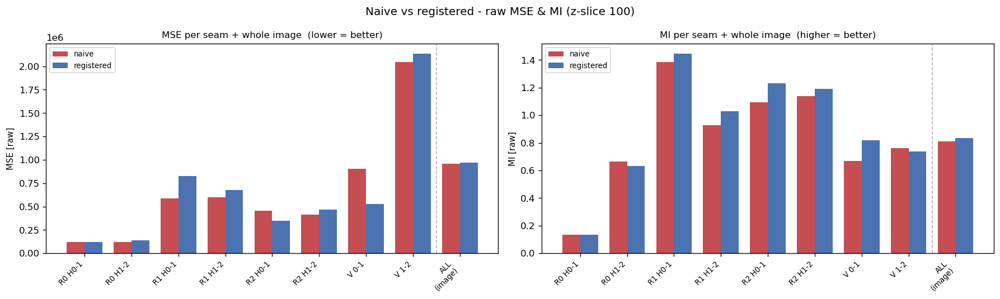

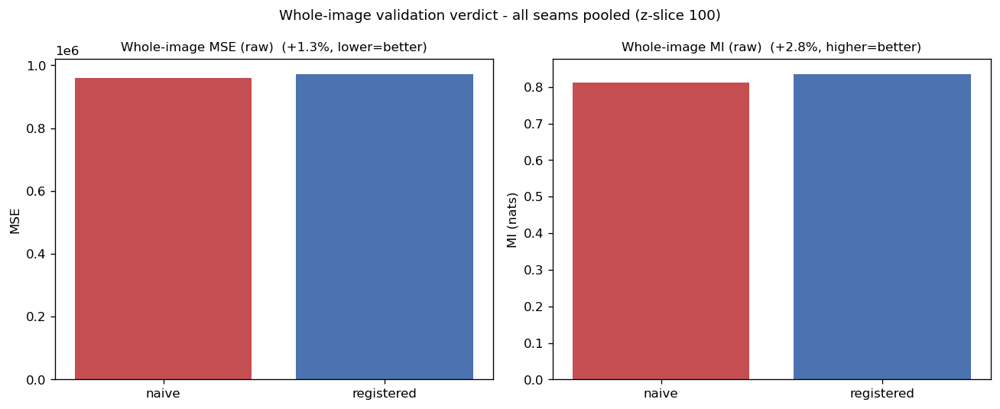

In [13]:
# -- Aggregate: per-seam + whole-image MSE/MI for all 4 intensity variants ------
labels = [m['label'] for m in seam_metrics]

def _pool(name, tag):
    """Concatenate every seam's foreground value pairs for one variant/placement,
    so the whole image gets ONE pooled MSE / MI (not a mean of per-seam numbers)."""
    A = [m[f'{name}|pool_{tag}'][0] for m in seam_metrics if m[f'{name}|pool_{tag}'][0].size]
    B = [m[f'{name}|pool_{tag}'][1] for m in seam_metrics if m[f'{name}|pool_{tag}'][1].size]
    if not A:
        return np.array([]), np.array([])
    return np.concatenate(A), np.concatenate(B)

agg = {}
for name in VARIANT_NAMES:
    an, bn = _pool(name, 'n'); ar, br = _pool(name, 'r')
    agg[name] = dict(
        mse_n=float(np.mean((an - bn) ** 2)) if an.size else float('nan'),
        mse_r=float(np.mean((ar - br) ** 2)) if ar.size else float('nan'),
        mi_n=mutual_information(an, bn) if an.size else float('nan'),
        mi_r=mutual_information(ar, br) if ar.size else float('nan'),
    )

def _pct(n, r):
    return 100.0 * (r - n) / n if (n and not np.isnan(n)) else float('nan')

# --- One text table per variant -----------------------------------------------
for name in VARIANT_NAMES:
    print('=' * 92)
    print(f'  VARIANT: {name:<6}  |  MSE (lower=better)  |  MI (higher=better)')
    print('=' * 92)
    print(f"  {'Seam':<12} {'MSE naive':>11} {'MSE reg':>11} {'MSE %':>8}   "
          f"{'MI naive':>9} {'MI reg':>9} {'MI %':>8}")
    print('  ' + '-' * 88)
    for m in seam_metrics:
        mn, mr = m[f'{name}|mse_n'], m[f'{name}|mse_r']
        in_, ir = m[f'{name}|mi_n'], m[f'{name}|mi_r']
        print(f"  {m['label']:<12} {mn:>11.4f} {mr:>11.4f} {_pct(mn, mr):>+7.1f}%   "
              f"{in_:>9.4f} {ir:>9.4f} {_pct(in_, ir):>+7.1f}%")
    print('  ' + '-' * 88)
    a = agg[name]
    print(f"  {'ALL (image)':<12} {a['mse_n']:>11.4f} {a['mse_r']:>11.4f} {_pct(a['mse_n'], a['mse_r']):>+7.1f}%   "
          f"{a['mi_n']:>9.4f} {a['mi_r']:>9.4f} {_pct(a['mi_n'], a['mi_r']):>+7.1f}%")
    print()
print('  MSE: negative % = improvement   |   MI: positive % = improvement')

# --- Bars: per seam + whole-image aggregate, naive vs registered (raw) ---------
plot_labels = labels + ['ALL\n(image)']
x = np.arange(len(plot_labels)); w = 0.38
fig, axes = plt.subplots(len(VARIANT_NAMES), 2,
                         figsize=(15, max(4.5, 3.4 * len(VARIANT_NAMES))),
                         squeeze=False)
for row, name in enumerate(VARIANT_NAMES):
    mse_n = [m[f'{name}|mse_n'] for m in seam_metrics] + [agg[name]['mse_n']]
    mse_r = [m[f'{name}|mse_r'] for m in seam_metrics] + [agg[name]['mse_r']]
    mi_n  = [m[f'{name}|mi_n']  for m in seam_metrics] + [agg[name]['mi_n']]
    mi_r  = [m[f'{name}|mi_r']  for m in seam_metrics] + [agg[name]['mi_r']]
    axm, axi = axes[row]
    axm.bar(x - w/2, mse_n, w, label='naive', color='#c44e52')
    axm.bar(x + w/2, mse_r, w, label='registered', color='#4c72b0')
    axm.axvline(len(labels) - 0.5, color='gray', ls='--', lw=1, alpha=0.6)
    axm.set_xticks(x); axm.set_xticklabels(plot_labels, rotation=45, ha='right', fontsize=8)
    axm.set_ylabel(f'MSE [{name}]', fontsize=9); axm.legend(fontsize=8)
    axi.bar(x - w/2, mi_n, w, label='naive', color='#c44e52')
    axi.bar(x + w/2, mi_r, w, label='registered', color='#4c72b0')
    axi.axvline(len(labels) - 0.5, color='gray', ls='--', lw=1, alpha=0.6)
    axi.set_xticks(x); axi.set_xticklabels(plot_labels, rotation=45, ha='right', fontsize=8)
    axi.set_ylabel(f'MI [{name}]', fontsize=9); axi.legend(fontsize=8)
    if row == 0:
        axm.set_title('MSE per seam + whole image  (lower = better)', fontsize=10)
        axi.set_title('MI per seam + whole image  (higher = better)', fontsize=10)
fig.suptitle(f'Naive vs registered - raw MSE & MI (z-slice {Z_SLICE})', fontsize=12)
plt.tight_layout(); plt.show()

# --- Whole-image validation verdict: aggregate naive vs registered ------------
a = agg['raw']
fig, (axm, axi) = plt.subplots(1, 2, figsize=(11, 4.5))
axm.bar(['naive', 'registered'], [a['mse_n'], a['mse_r']], color=['#c44e52', '#4c72b0'])
axm.set_title(f"Whole-image MSE (raw)  ({_pct(a['mse_n'], a['mse_r']):+.1f}%, lower=better)", fontsize=10)
axm.set_ylabel('MSE')
axi.bar(['naive', 'registered'], [a['mi_n'], a['mi_r']], color=['#c44e52', '#4c72b0'])
axi.set_title(f"Whole-image MI (raw)  ({_pct(a['mi_n'], a['mi_r']):+.1f}%, higher=better)", fontsize=10)
axi.set_ylabel('MI (nats)')
fig.suptitle('Whole-image validation verdict - all seams pooled (z-slice %d)' % Z_SLICE, fontsize=11)
plt.tight_layout(); plt.show()
